In [1]:
import pandas as pd
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
from umap import UMAP
import os
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from cuml import UMAP as cumlUMAP



# Analiza tematu 0 - BERTopic

Notebook powstał aby ponownie wydzielić zbiór tematów z najbardziej licznego a zarazem najbardziej ogólnego tematu 0.

In [2]:
df_sejm_bertopic_annotated = pd.read_csv('./bertopic_results/sejm/sejm_bertopic_annotated.csv')

In [3]:
df_sejm_bertopic_annotated.head(100)

,date,author,text_all,place,TextBlob_Subjectivity,TextBlob_Polarity,sentiment_herbert,openai_result,text_part,sentiment,topic,is_outlier,detected_topic
0,2019-11-12,prezydent rzeczypospolitej polskiej andrzej duda,drodzy rodacy! wielce szanowny panie marszałku...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,True,1
1,2019-11-12,senior antoni macierewicz,bardzo dziękuję panu prezydentowi za tak istot...,sejm,0.0625,-0.062500,1,NaN,NaN,NaN,NaN,True,1
3,2019-11-12,daniel milewski,poseł antoni macierewicz. dziękuję bardzo. pro...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,True,1
27,2019-11-12,marzena machałek,dziękuję. panie marszałku! wysoka izbo! panie ...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,True,1
28,2019-11-12,senior antoni macierewicz,"bardzo dziękuję, pani poseł. zanim przejdziemy...",sejm,0.0000,0.000000,0,NaN,NaN,NaN,NaN,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1111,2019-11-19,prezes rady ministrów mateusz morawiecki,pani marszałek! wysoka izbo! bardzo dziękuję z...,sejm,0.1925,0.103359,1,NaN,NaN,NaN,NaN,True,0
1112,2019-11-19,marszałek sejmu,dziękuję panu premierowi. zamykam dyskusję. do...,sejm,0.0000,0.000000,1,NaN,NaN,NaN,NaN,False,0
1138,2019-11-19,marek suski,pani marszałek! w związku z tym wnioskiem form...,sejm,0.0000,0.000000,0,NaN,NaN,NaN,NaN,True,0
1139,2019-11-19,marszałek sejmu,"panie pośle, dziękuję bardzo. ale to nieprawda...",sejm,0.0000,0.000000,0,NaN,NaN,NaN,NaN,True,0


Number of speeches with topic 0: 314511 (61.49%)
Sample of speeches:
	ja bym chciał się dowiedzieć czegoś, o co wstępnie już pytałem. jak dalece ta ustawa... no, czy nie dostrzegacie państwo sprzeczności? panie ministrze, chodzi o to, że obywatel polski, pochodzenia polskiego, ma konstytucyjną gwarancję przebywania i osiedlania się w polsce. tego ustawa o cudzoziemcach nie realizuje. to nie zostało zaskarżone do trybunału konstytucyjnego, ale ta sprzeczność, moim zdaniem, istnieje od lat. następna sprawa. czy w związku z tym, że jest ta nasza ustawa o obywatelstwie, ministerstwo planuje korektę systemu informacyjnego schengen? przecież obywatele, którzy zachowali obywatelstwo polskie, nie powinni być traktowani jako cudzoziemcy. czy takie zagadnienie w ogóle zostało podniesione w resorcie? dziękuję.
	nie, absolutnie. to robią krasnoludki, tak? a tutaj, szanowni państwo, wylewacie krokodyle łzy, że brak pieniędzy, że brak surowców. pamiętam, że jak budowany był nord stream 2, to donald 

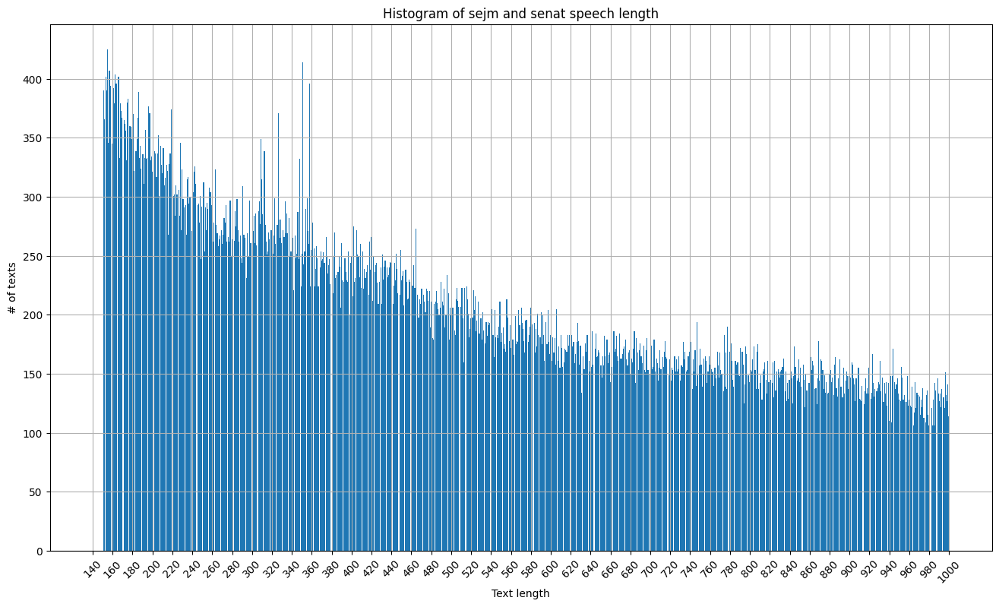

In [4]:
df_sejm_topic0_annotated = df_sejm_bertopic_annotated[df_sejm_bertopic_annotated.detected_topic == 0]

print(f'Number of speeches with topic 0: {len(df_sejm_topic0_annotated)} ({100*len(df_sejm_topic0_annotated)/len(df_sejm_bertopic_annotated):.2f}%)')
print('Sample of speeches:')
for line in df_sejm_topic0_annotated.text_all.sample(20):
    print(f'\t{line}')


fig, ax = plt.subplots()
max_range=1000
df_sejm_topic0_annotated.text_all.str.len().hist(range=(140, max_range), bins=max_range, ax=ax)
ax.set_title('Histogram of sejm and senat speech length')
ax.set_ylabel('# of texts')
ax.set_xlabel('Text length')
ax.set_xticks(range(140, max_range+1, 20))
ax.set_xticklabels(range(140, max_range+1, 20), rotation=45)
fig.set_size_inches(16, 9)

In [5]:
embedding_model='paraphrase-multilingual-MiniLM-L12-v2'
sentence_model = SentenceTransformer(embedding_model, device='cuda')
if not ('embeddings' in locals()):
    if (os.path.exists('./bertopic_results/sejm_topic0/sejm_text_embeddings.npy')):
        embeddings = np.load('./bertopic_results/sejm_topic0/sejm_text_embeddings.npy')
    else:
        embeddings: np.ndarray = sentence_model.encode(df_sejm_topic0_annotated.text_all.to_numpy(), show_progress_bar=True, batch_size=128)
        np.save('./bertopic_results/sejm_topic0/sejm_text_embeddings.npy', embeddings)

In [6]:
representation_model = KeyBERTInspired(random_state=42)
calculate_probabilities = True # get document's topic probs for each detected topic, not just the predicted one
umap_model = cumlUMAP(n_neighbors=10, n_components=5, min_dist=0.0, metric='cosine', random_state=42, verbose=True)
nr_topics: int | str = 50

if not os.path.exists('./bertopic_results/sejm_topic0/model/topic_embeddings.bin'):
    topic_model = BERTopic(embedding_model=embedding_model, nr_topics=nr_topics, verbose=True, representation_model=representation_model, calculate_probabilities=calculate_probabilities, umap_model=umap_model)
    topics, probs = topic_model.fit_transform(df_sejm_topic0_annotated.text_all, embeddings=embeddings)
    topic_model.save('./bertopic_results/sejm_topic0/model', serialization="pytorch", save_ctfidf=True)
else:
    topic_model = BERTopic.load('./bertopic_results/sejm_topic0/model')
    topics, probs = topic_model.transform(df_sejm_topic0_annotated.text_all, embeddings=embeddings)

2024-01-03 22:28:51,692 - BERTopic - Predicting topic assignments through cosine similarity of topic and document embeddings.


In [7]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,207402,-1_komisji_minister_będą_państwo,"[komisji, minister, będą, państwo, ustawa, ust...",NaN
1,0,69814,0_komisji_senatu_poprawkę_poprawka,"[komisji, senatu, poprawkę, poprawka, poprawce...",NaN
2,1,5332,1_budżetowej_budżecie_budżetu_budżet,"[budżetowej, budżecie, budżetu, budżet, minist...",NaN
3,2,3461,2_szkołach_szkół_szkole_edukacji,"[szkołach, szkół, szkole, edukacji, nauczania,...",NaN
4,3,3360,3_energetyki_energii_elektrowni_środowiska,"[energetyki, energii, elektrowni, środowiska, ...",NaN
5,4,2935,4_uroczystości_historii_podczas_marszałku,"[uroczystości, historii, podczas, marszałku, z...",NaN
6,5,2858,5_emerytalnych_emeryturę_emerytalnego_emerytów,"[emerytalnych, emeryturę, emerytalnego, emeryt...",NaN
7,6,2694,6_szpitale_szpitali_lekarzy_szpitala,"[szpitale, szpitali, lekarzy, szpitala, szpita...",NaN
8,7,2409,7_ministra_minister_państwowe_państwowych,"[ministra, minister, państwowe, państwowych, r...",NaN
9,8,2090,8_ministra_dziękuję_minister_panu,"[ministra, dziękuję, minister, panu, pana, mar...",NaN


In [8]:
print('Topics summary:')
documents_info = topic_model.get_document_info(df_sejm_topic0_annotated.text_all)
for index, line in topic_model.get_topic_info().iterrows():
    print()

    matching_docs = documents_info.loc[documents_info.Topic == line.Topic]
    
    print(f'Topic:', line.Name, f"({len(matching_docs)}, {len(matching_docs)*100/len(documents_info):.2f}%)")
    print(f"Representation:\n{line.Representation}")


    print('Texts:')
    for text in matching_docs['Document'].sample(10):
        print(f"\t{text}")

Topics summary:

Topic: -1_komisji_minister_będą_państwo (207402, 65.94%)
Representation:
['komisji', 'minister', 'będą', 'państwo', 'ustawa', 'ustawy', 'ministrze', 'projektu', 'państwa', 'projekt']
Texts:
	szanowny panie marszałku! wysoka izbo! w imieniu klubu poselskiego sojusz lewicy demokratycznej mam zaszczyt przedstawić stanowisko w sprawie sprawozdania komisji infrastruktury o poselskim projekcie ustawy o zmianie ustawy prawo telekomunikacyjne (druki nr 4605 i 4618). proponowana zmiana przepisów regulujących publicznie dostępne usługi telekomunikacyjne z dodatkowym świadczeniem, zwane usługami o podwyższonej opłacie (zmiana art. 64 i 65 ustawy oraz dodanie art. 64a), polega na: rozszerzeniu obowiązków informacyjnych wobec odbiorców tych usług i wobec prezesa uke, włączając w to użytkowników sieci ruchomych (niestacjonarnych), szczególnym uregulowaniu usług o podwyższonej opłacie, świadczonych na zasadzie subskrypcji, umożliwieniu blokowania na żądanie połączeń wychodzących na n

In [9]:
ignore_outlier = True
topic_info_df = topic_model.get_topic_info()
if (ignore_outlier):
    topic_info_df = topic_info_df.loc[topic_info_df.Topic != -1]

fig = px.histogram(log_x=True, y=topic_info_df['Name'], x=topic_info_df['Count'], orientation='h', title='Histogram of topic occurences' + (' (outlier topic -1 omitted)' if ignore_outlier else ''))
fig.update_layout(height=900)
fig.update_xaxes(title_text='# of Occurences')

# Update y-axis label
fig.update_yaxes(title_text='Topic name')
fig.show()

In [10]:
topic_model.visualize_barchart(top_n_topics=nr_topics if isinstance(nr_topics, int) else 50, n_words=20)

In [11]:
topic_model.visualize_documents(list(df_sejm_topic0_annotated.text_all), width=1366, height=768, sample=0.03, hide_annotations=True)

/home/staszek/mgr/wiatrolapy/env/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning:

The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.



In [12]:
df_sejm_topic0_annotated['detected_topic_from_topic0'] = topics
df_sejm_topic0_annotated.to_csv('./bertopic_results/sejm_topic0/sejm_bertopic_annotated_additional_column_topic0.csv', index_label=False)